In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML
from tensorflow.keras import regularizers

In [ ]:
BATCH_SIZE = 32
IMAGE_SIZE = 200
CHANNELS=3

In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/drive/MyDrive/Bean_Dataset",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 7504 files belonging to 3 classes.


In [ ]:
class_names = dataset.class_names
class_names

['als', 'bean_rust', 'healthy']

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 200, 200, 3)
[1 2 2 0 0 1 0 1 0 1 1 0 2 0 2 1 2 0 0 2 0 1 0 2 1 0 0 1 2 0 2 0]


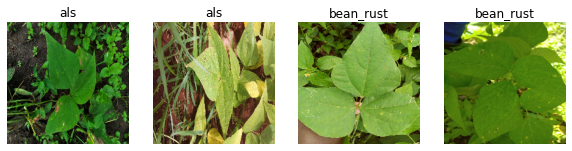

In [ ]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(4):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [ ]:
len(dataset)

235

In [ ]:
train_size = 0.8
len(dataset)*train_size

188.0

In [ ]:
train_ds = dataset.take(188)
len(train_ds)

188

In [ ]:
test_ds = dataset.skip(188)
len(test_ds)

47

In [ ]:
val_size=0.1
len(dataset)*val_size

23.5

In [ ]:
val_ds = test_ds.take(24)
len(val_ds)

24

In [ ]:
test_ds = test_ds.skip(24)
len(test_ds)

23

In [ ]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [ ]:
len(train_ds)

188

In [ ]:
len(val_ds)

23

In [ ]:
len(test_ds)

24

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

In [ ]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), padding = 'same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu', padding = 'same'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu', padding = 'same'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu', padding = 'same'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu', padding = 'same'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu', padding = 'same'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(3, activation='softmax'),
])

model.build(input_shape=input_shape)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
logdir='log'

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
model.summary()

In [ ]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    epochs=50,
    callbacks=[tensorboard_callback]
)

Epoch 1/50
188/188 [==============================] - 1264s 716ms/step - loss: 1.0867 - accuracy: 0.3842 - val_loss: 1.0768 - val_accuracy: 0.4062
Epoch 2/50
188/188 [==============================] - 36s 192ms/step - loss: 1.0401 - accuracy: 0.4633 - val_loss: 0.9956 - val_accuracy: 0.4986
Epoch 3/50
188/188 [==============================] - 37s 195ms/step - loss: 0.9786 - accuracy: 0.5145 - val_loss: 0.9700 - val_accuracy: 0.5054
Epoch 4/50
188/188 [==============================] - 36s 192ms/step - loss: 0.9238 - accuracy: 0.5570 - val_loss: 0.9670 - val_accuracy: 0.5557
Epoch 5/50
188/188 [==============================] - 36s 192ms/step - loss: 0.8675 - accuracy: 0.5978 - val_loss: 1.1054 - val_accuracy: 0.4891
Epoch 6/50
188/188 [==============================] - 36s 192ms/step - loss: 0.8080 - accuracy: 0.6327 - val_loss: 0.7728 - val_accuracy: 0.6345
Epoch 7/50
188/188 [==============================] - 36s 191ms/step - loss: 0.7712 - accuracy: 0.6485 - val_loss: 0.7104 - val_

In [ ]:
%load_ext tensorboard
%tensorboard --logdir log

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file = 'model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
scores = model.evaluate(test_ds)

24/24 [==============================] - 99s 25ms/step - loss: 0.1313 - accuracy: 0.9544


In [ ]:
scores

[0.13125714659690857, 0.9544270634651184]

In [ ]:
predictions = model.predict(test_ds)

In [ ]:
import numpy as np
np.round(predictions)

In [ ]:
test_labels = tf.concat([labels_batch for image_batch, labels_batch in test_ds], axis=0)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import itertools
%matplotlib inline

cm = confusion_matrix(y_true=test_labels, y_pred=np.argmax(predictions, axis = -1))

In [ ]:
def plot_confusion_matrix(cm, classes,
                        normalize=False,
                        title='Confusion matrix',
                        cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
cm_plot_labels = ['als','bean_rust','healthy']

Confusion matrix, without normalization
[[133  69  76]
 [ 67  92  80]
 [ 73  65 113]]


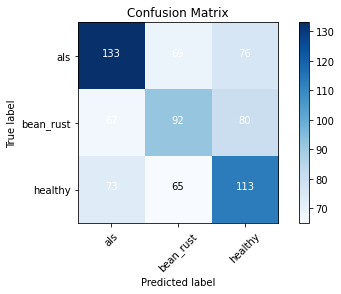

In [ ]:
plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix')

In [ ]:
#import os
#model.save(os.path.join('/content/drive/MyDrive','bean Final.imageclassifier.h5'))

first image to predict
actual label: healthy
1/1 [==============================] - 0s 131ms/step
predicted label: healthy


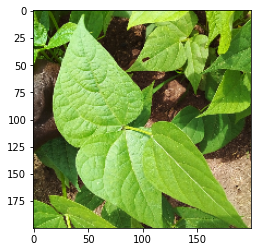

In [ ]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 17ms/step


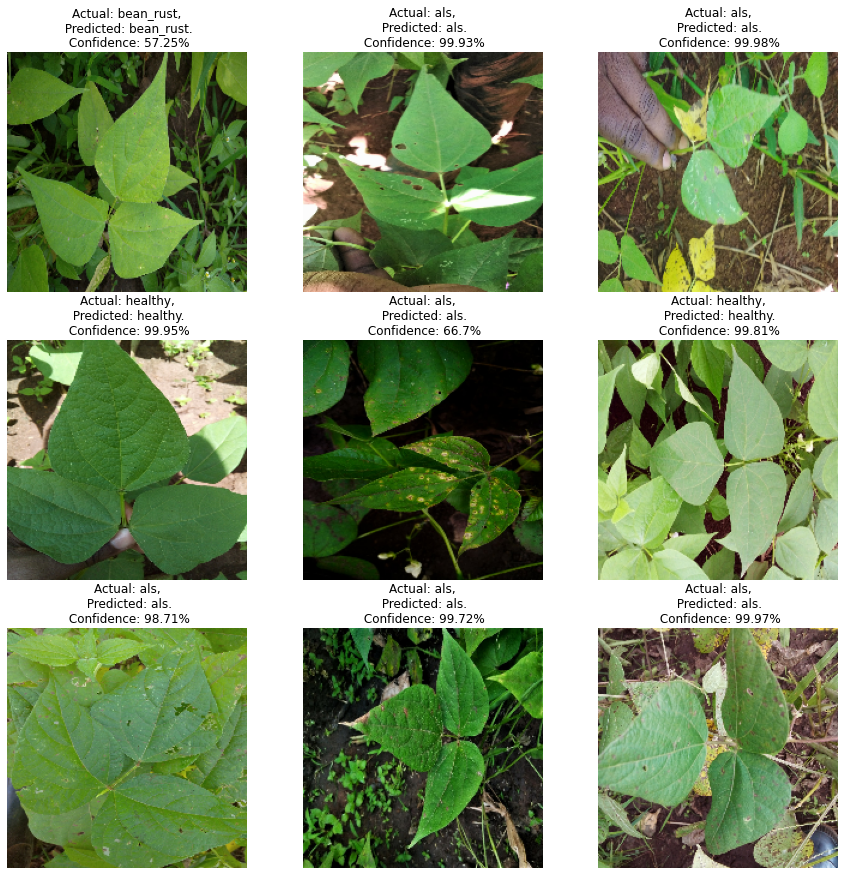

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")